## 컨브넷 학습 시각화
* 딥러닝 모델을 '블랙 박스(black box)' 같다고 자주 이야기한다.
* 학습된 표현에서 사람이 이해하기 쉬운 형태를 뽑아내거나 제시하기 어렵기 때문이다.
* 컨브넷의 표현은 시각적인 개념을 학습한 것이기 때문에 시각화하기 아주 좋다.
* 가장 사용이 편하고 유용한 세 가지 기법
    * **컨브넷 중간층의 출력(중간층에 있는 활성화)을 시각화하기**: 연속된 컨브넷 층이 입력을 어떻게 변혐시키는지 이해하고 개별적인 컨브넷 필터의 의미를 파악하는 데 도움이 된다.
    * **컨브넷 필터를 시각화하기**: 컨브넷의 필터가 찾으려는 시각적인 패턴과 개념이 무엇인지 상세하게 이해하는 데 도움이 된다.
    * **클래스 활성화에 대한 히트맵(heatmap)을 이미지에 시각화하기**: 이미지의 어느 부분이 주어진 클래스에 속하는 데 기대했는지 이해하고 이미지에서 객체 위치를 추정(localization)하는데 도움이 된다.

### 중간층의 활성화 시각화하기
* 중간층의 활성화 시각화는 어떤 입력이 주어졌을 때 네트워크에 있는 여러 합성곱과 풀링 층이 출력하는 특성 맵을 그리는 것이다.(층위 출력이 하캬성화 함수의 출력이라서 종종 **활성화**(activation)라고 부른다.)
* 이 방법은 네트워크에 의해 학습된 필터를이 어떻게 입력을 분해하는지 보여 준다.
* 너비, 높이, 깊이(채널) 3개의 처윈에 대해 특성 맵을 시각화하는 것이 좋다.

In [1]:
from keras.models import load_model

model = load_model('cats_and_dogs_small_2.h5')
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 17, 17, 128)     

In [3]:
import os

DEV_PATH = os.environ['DEV_PATH']

img_path = os.path.join(DEV_PATH, 'datasets/cats_and_dogs_small/test/cats/cat.1700.jpg')

from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

print(img_tensor.shape)

(1, 150, 150, 3)


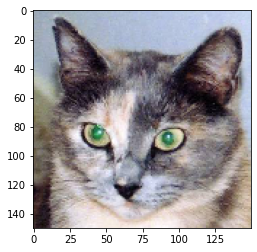

In [4]:
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()

* 확인하고 싶은 특성 맵을 추출하기 위해 이미지 배치를 입력으로 받아 모든 학성곱과 풀링 층의 활성화를 출력하는 케라스 모델을 만들 것이다.

In [6]:
from keras import models

layer_outputs = [layer.output for layer in model.layers[:8]]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

* 입력 이미지가 주입될 때 이 모델을 원본 모델의 활성화 값을 반환한다.
* 일반적으로 모델은 몇 개의 입력과 출력이라도 가질 수 있다.
* 이 모델은 하나의 입력과 층의 활성화마다 하나씩 총 8개의 출력을 가진다.

In [7]:
activations = activation_model.predict(img_tensor)

1/1 [==============================] - 4s 4s/step


In [33]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 148, 148, 32)


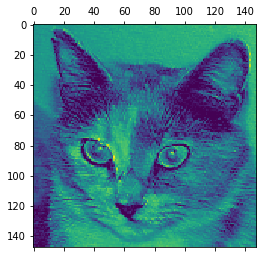

In [9]:
plt.matshow(first_layer_activation[0, :, :, 19], cmap='viridis')

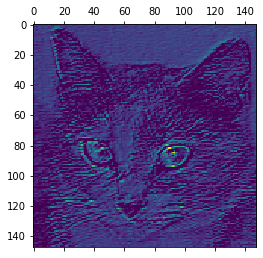

In [10]:
plt.matshow(first_layer_activation[0, :, :, 15], cmap='viridis')

C:\Users\posky\AppData\Local\Temp\ipykernel_9732\421120688.py:19: RuntimeWarning: invalid value encountered in divide
  channel_image /= channel_image.std()


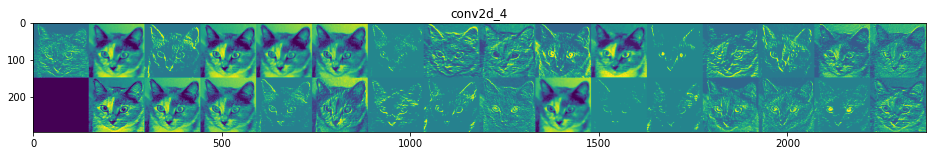

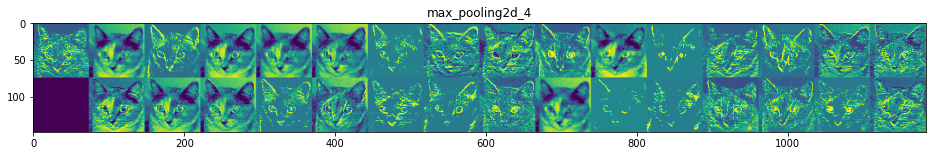

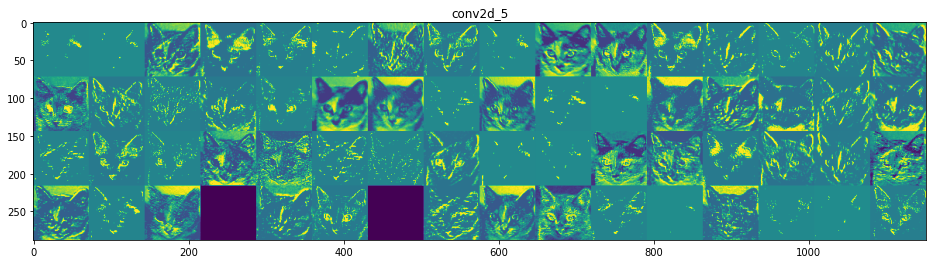

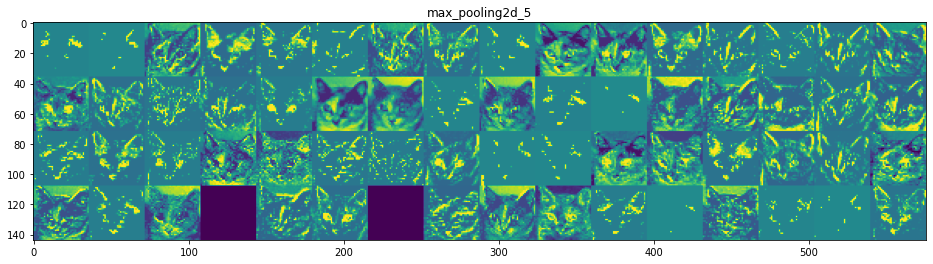

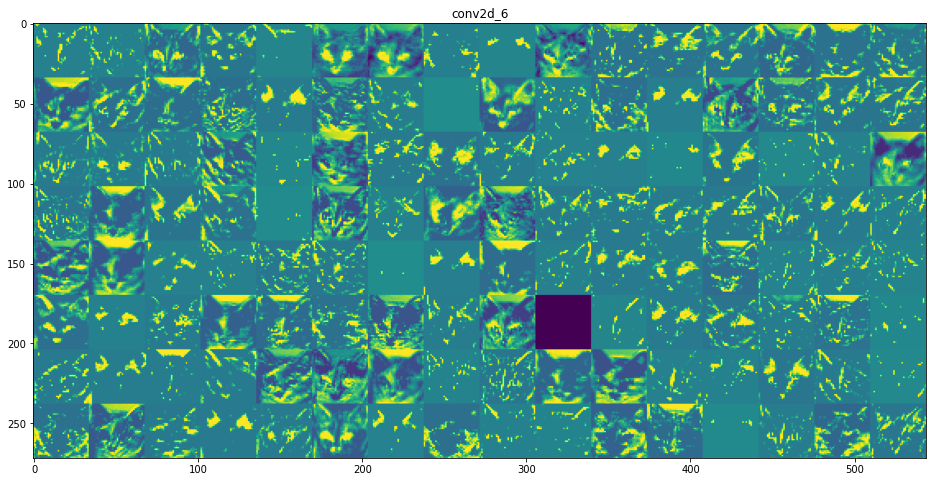

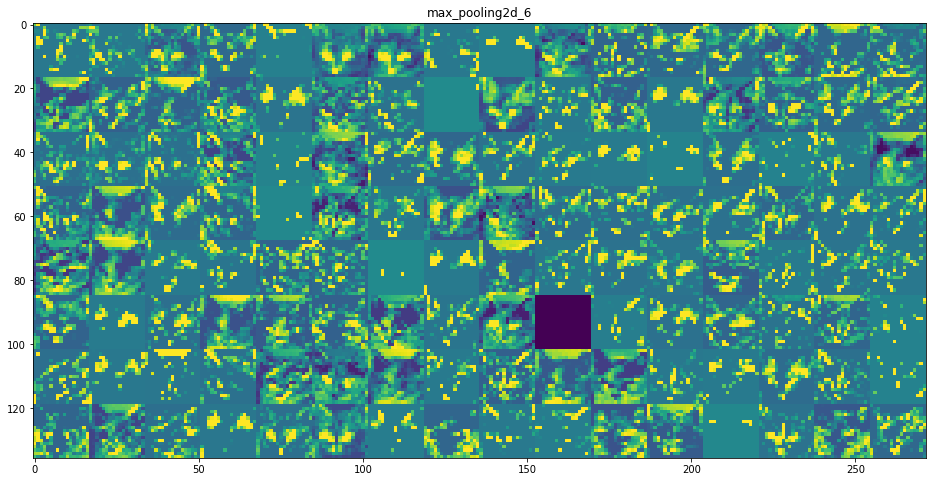

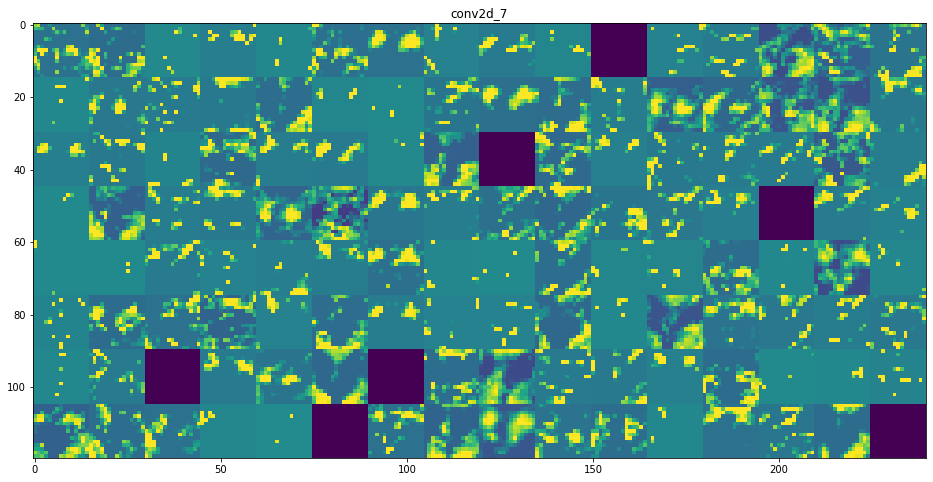

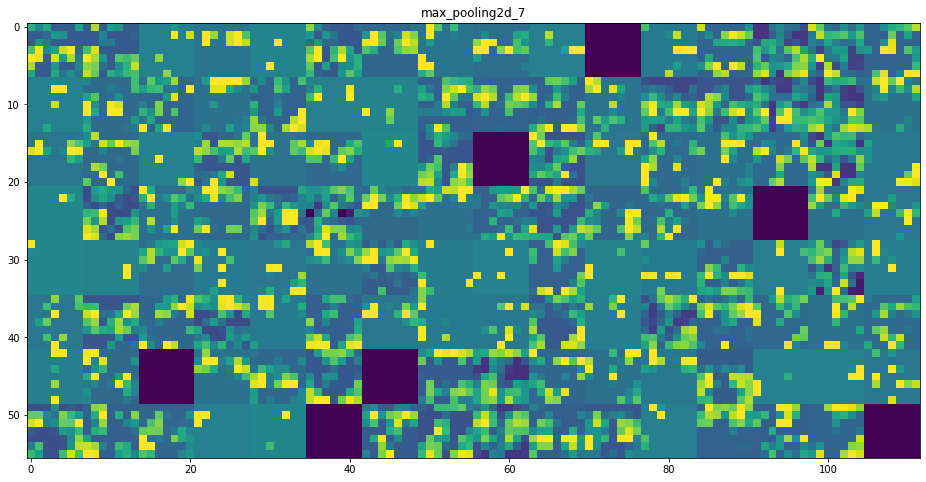

In [11]:
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]

    size = layer_activation.shape[1]

    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0, :, :, col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show()

* 첫 번째 층은 여러 종류의 에지 감지기를 모아 놓은 것 같다. 이 단계의 활성화에는 초기 사진에 있는 거의 모든 정보가 유지된다.
* 상위 층으로 갈수록 활성화는 점점 더 추상적으로 되고 시각적으로 이해하기 어려워진다. '고용이 귀'와 '고용이 눈'처럼 고수준 개념을 인코딩하기 시작한다. 상위 층의 표현은 이미지의 시각적 콘텐츠에 관한 점보가 점점 줄어들고 이미지의 클래스에 관한 점보가 점점 증가한다.
* 비어 있는 활성화가 층이 깊어짐에 따라 늘어난다. 층을 올라가면서 활성화되지 않는 필터들이 생긴다. 필터에 인코딩된 패턴이 입력 이미지에 나타나지 않았다는 것을 의미한다.

* 층에서 추출한 특성은 층의 깊이를 따라 점점 더 추상적이 된다.
* 높은 층의 활성화는 특정 입력에 관한 시각적 정보가 점점 줄어들고 타깃에 관한 정보(이 경우에는 강아지 또는 고용이 이미지의 클래스)가 점점 더 증가한다.
* 심층 신경망은 입력되는 원본 데이터(여기서는 RGB 포맷의 사진)에 대한 정보 정제 파이프라인처럼 작동한다.
* 반복적인 변환을 통해 관계없는 정보(예를 들어 이미지에 있는 특정 요소)를 걸러 내고 유용한 정보는 강조되고 개선된다.

### 컨브넷 필터 시각화하기
* 각 필터가 반응하는 시각적 패턴을 그려보는 것이다.
* 빈 입력 이미지에서 시작해서 특정 필터의 응답을 최대화하기 위해 컨브넷 입력 이미지에 경사 상승법을 적용한다.
* 결과적으로 입력 이미지는 선택된 필터가 최대로 응답하는 이미지가 될 것이다.
---
* 특정 합성곱 층의 한 필터 값을 최대화하는 손실 함수를 정의한다.
* 이 활성화 값을 최대화하기 위해 입력 이미지를 변경하도록 확률적 경사 상습법을 사용한다.

In [19]:
from keras.applications import VGG16
from keras import backend as K
import tensorflow as tf
tf.compat.v1.disable_eager_execution()


model = VGG16(weights='imagenet', include_top=False)

layer_name = 'block3_conv1'
filter_index = 0

layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])

In [20]:
grads = K.gradients(loss, model.input)[0]

* 경사 상승법 과정을 부드럽게 하기 위해 사용하는 한 가지 기법을 그래디언트 텐서를 L2 노름(텐서에 있는 값을 제곱한 합의 제곱근)으로 나누어 정규화하는 것이다.
* 이렇게 하면 입력 이미지에 적용할 수정량의 크기를 항상 일정 범위 안에 놓을 수 있다.

In [21]:
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

* 이제 주어진 입력 이미지에 대해 손실 텐서와 그래디언트 텐서를 계산해야 한다.

In [22]:
iterate = K.function([model.input], [loss, grads])

loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

In [23]:
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.     # start grayscale with noise

step = 1.       # gradient step for updating
for i in range(40):
    loss_value, grads_value = iterate([input_img_data])
    input_img_data += grads_value * step

* 결과 이미지 텐서는 (1, 150, 150, 3) 크기의 부동 소수 텐서이다.
* 이 텐서 값은 [0, 255] 사이의 정수가 아니다.
* 따라서 출력 가능한 이미지로 변경하기 위해 후처리할 필요가 있다.

In [24]:
def deprocess_image(x):
    # mean 0, std 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    x += 0.5
    x = np.clip(x, 0, 1)

    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [25]:
def generate_pattern(layer_name, filter_index, size=150):
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    grads = K.gradients(loss, model.input)[0]

    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    iterate = K.function([model.input], [loss, grads])

    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step

    img = input_img_data[0]
    return deprocess_image(img)

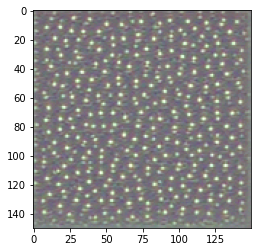

In [26]:
plt.imshow(generate_pattern('block3_conv1', 0))

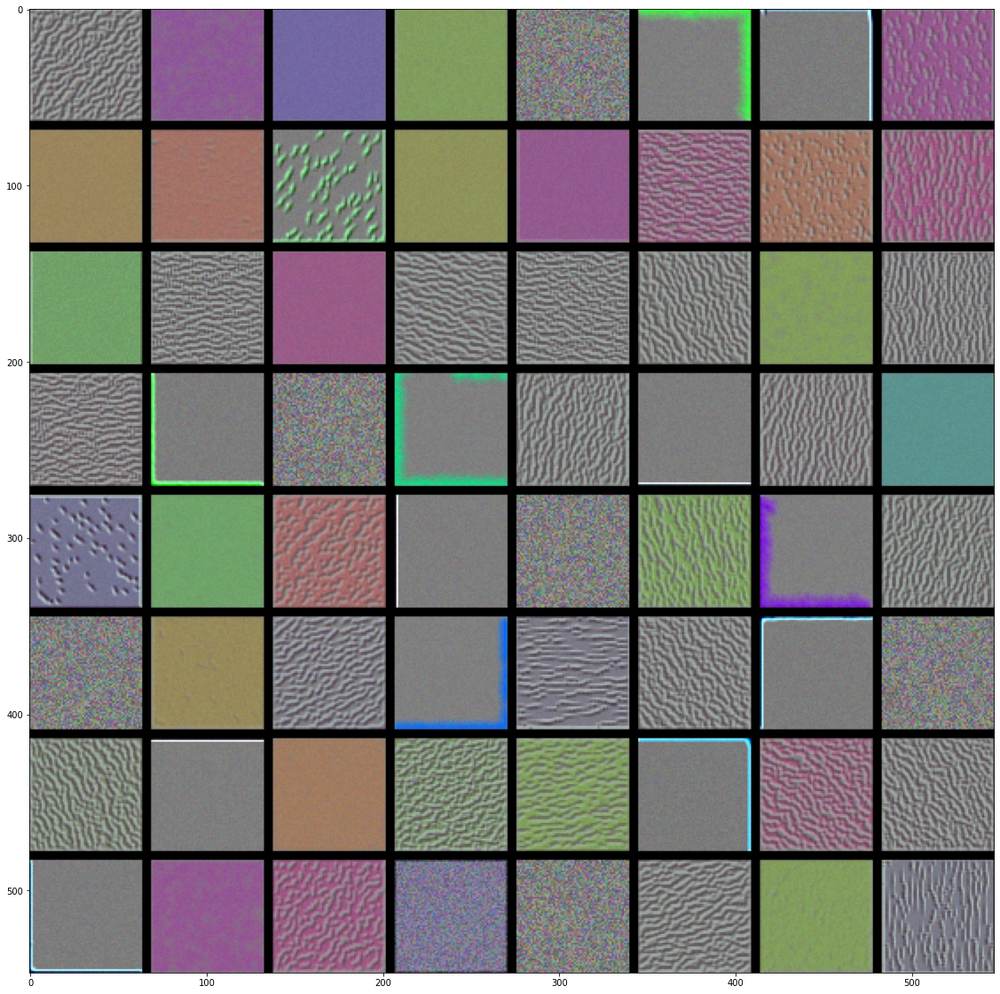

In [27]:
layer_name = 'block1_conv1'
size = 64
margin = 5

results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3), dtype='uint8')

for i in range(8):
    for j in range(8):
        filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

        horizontal_start = i * size + i * margin
        horizontal_end = horizontal_start + size
        vertical_start = j * size + j * margin
        vertical_end = vertical_start + size
        results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

plt.figure(figsize=(20, 20))
plt.imshow(results)

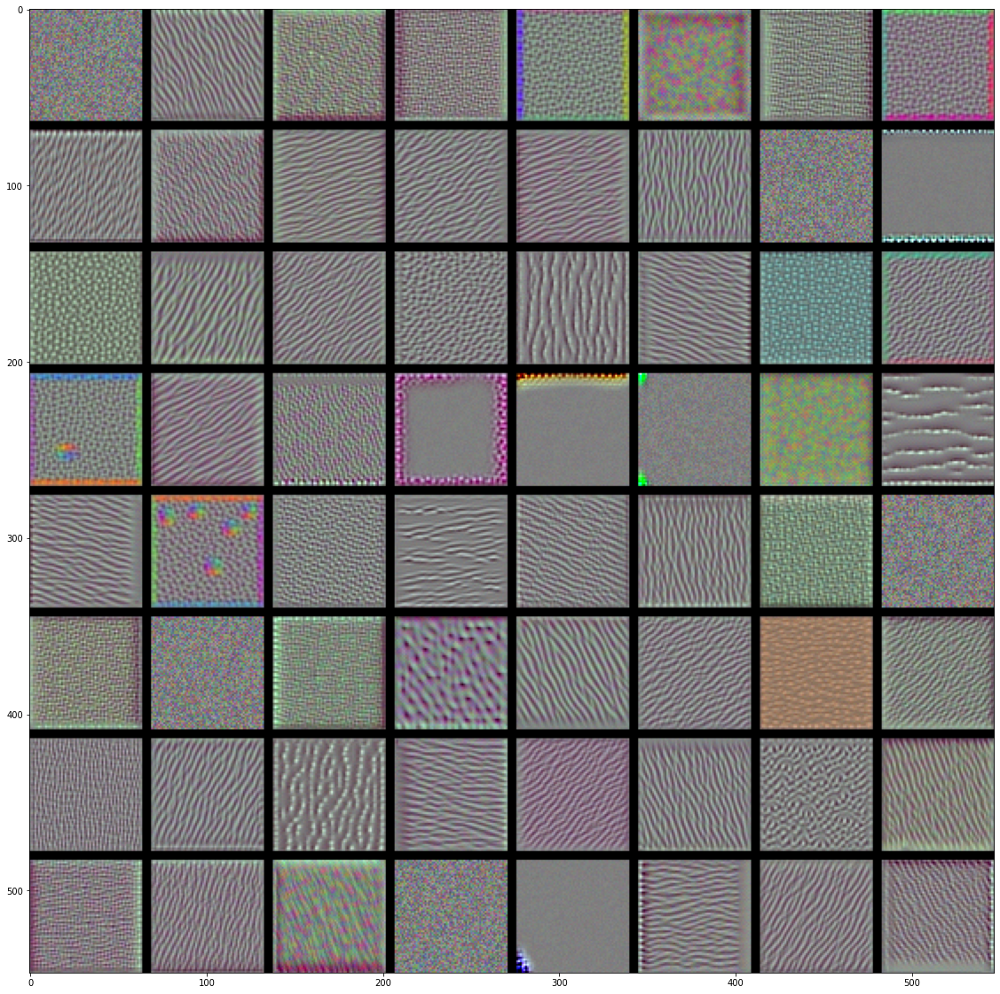

In [28]:
layer_name = 'block2_conv1'
size = 64
margin = 5

results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3), dtype='uint8')

for i in range(8):
    for j in range(8):
        filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

        horizontal_start = i * size + i * margin
        horizontal_end = horizontal_start + size
        vertical_start = j * size + j * margin
        vertical_end = vertical_start + size
        results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

plt.figure(figsize=(20, 20))
plt.imshow(results)

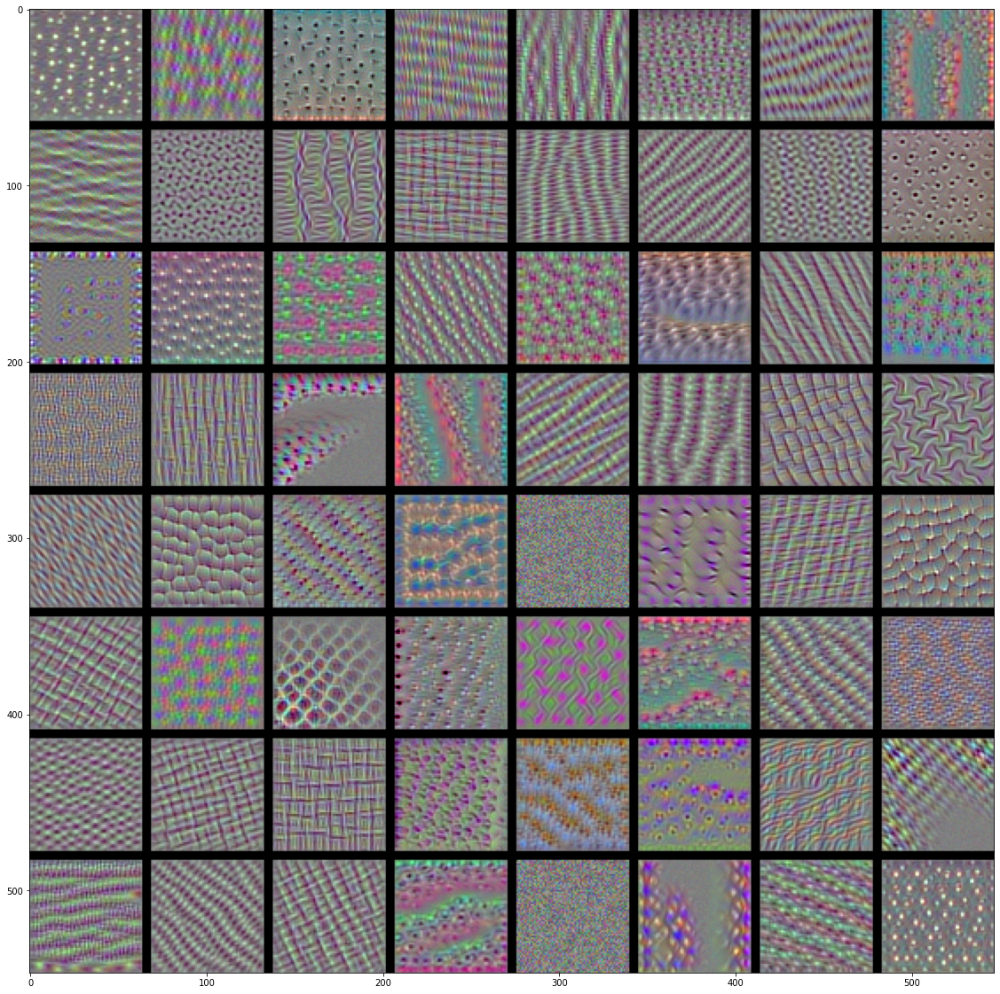

In [29]:
layer_name = 'block3_conv1'
size = 64
margin = 5

results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3), dtype='uint8')

for i in range(8):
    for j in range(8):
        filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

        horizontal_start = i * size + i * margin
        horizontal_end = horizontal_start + size
        vertical_start = j * size + j * margin
        vertical_end = vertical_start + size
        results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

plt.figure(figsize=(20, 20))
plt.imshow(results)

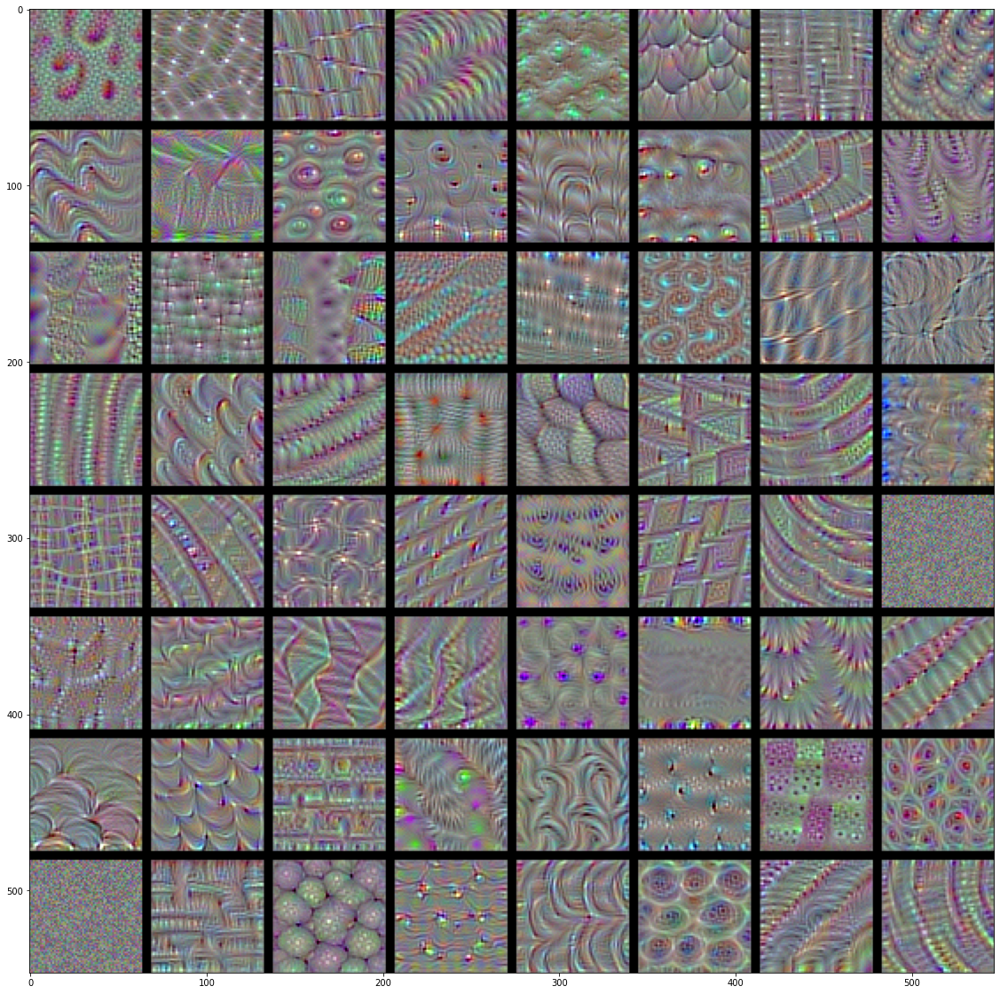

In [30]:
layer_name = 'block4_conv1'
size = 64
margin = 5

results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3), dtype='uint8')

for i in range(8):
    for j in range(8):
        filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

        horizontal_start = i * size + i * margin
        horizontal_end = horizontal_start + size
        vertical_start = j * size + j * margin
        vertical_end = vertical_start + size
        results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

plt.figure(figsize=(20, 20))
plt.imshow(results)

* 이런 필터 시각화를 통해 컨브넷 층이 바라보는 방식을 이해할 수 있다.
* 컨브넷의 각 층은 필터의 조핫으로 입력을 표현할 수 있는 일련의 필터를 학습한다.
* 이 컨브넷 필터들은 모델의 상위 층으로 갈수록 점점 더 복잡해지고 개선된다.
    * 모델에 있는 첫 번째 층(block1_conv1)의 필터는 간단한 대각선 방향의 에지와 색깔(또는 어떤 경우에 색깔이 있는 에지)을 인코딩한다.
    * block2_conv1의 필터는 에지나 색깔의 조합으로 만들어진 간단한 질감을 인코딩한다.
    * 더 상위 층의 필터는 깃털, 순, 나뭇잎 등 자연적인 이미지에서 찾을 수 있는 질감을 닮아 가기 시작한다.

### 클래스 활성화의 히트맵 시각화하기
* 이 방법은 이미지의 어느 부분이 컨브넷의 최종 분류 결정에 기여하는지 이해하는 데 유용하다.
* 분류에 실수가 있는 경우 컨브넷의 결정 과정을 디버깅하는 데 도움이 된다.
* 이 기법의 중류를 일반적으로 **클래스 활성화 맵**(Class Activation Map, CAM) 시각화라고 부른다.

In [31]:
from keras.applications.vgg16 import VGG16

model = VGG16(weights='imagenet')

553467096/553467096 [==============================] - 14s 0us/step


In [32]:
from tensorflow.keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

img_path = os.path.join(DEV_PATH, 'datasets/creative_commons_elephant.jpg')

img = image.load_img(img_path, target_size=(224, 224))

x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

In [34]:
preds = model.predict(x)
print('Predicted:', decode_predictions(preds, top=3)[0])

c:\Users\posky\anaconda3\envs\tf20\lib\site-packages\keras\engine\training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


35363/35363 [==============================] - 0s 1us/step
Predicted: [('n02504458', 'African_elephant', 0.4414897), ('n01871265', 'tusker', 0.1896735), ('n02504013', 'Indian_elephant', 0.1741744)]


In [35]:
np.argmax(preds[0])

386

In [36]:
african_elephant_output = model.output[:, 386]

last_conv_layer = model.get_layer('block5_conv3')
grads = K.gradients(african_elephant_output, last_conv_layer.output)[0]
pooled_grads = K.mean(grads, axis=(0, 1, 2))

iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])
pooled_grads_value, conv_layer_output_value = iterate([x])

for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

heatmap = np.mean(conv_layer_output_value, axis=-1)

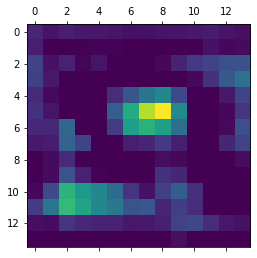

In [38]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)

In [40]:
import cv2

img = cv2.imread(img_path)
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = heatmap * 0.4 + img
cv2.imwrite(os.path.join(DEV_PATH, 'datasets/elephant_cam.jpg'), superimposed_img)

True

* 왜 네트워크가 이 이미지에 아프리카 코끼리가 있다고 생각하는가?
* 아프리카 코끼리가 사진 어디에 있는가?

## 요약
* 컨브넷은 시각적인 분류 문제를 다루는 데 최상의 도구이다.
* 컨브넷은 우리가 보는 세상을 표현하기 위한 패턴의 계층 구조와 개념을 학습한다.
* 학습된 표현은 쉽게 분석할 수 있다.
* 이미지 분류 문제를 풀기 위해 자신만의 컨브넷을 처음부터 훈련시킬 수 있다.
* 과대적합을 줄이기 위해 데이터를 증식하는 방법을 배윘다.
* 사전 훈련된 컨브넷을 사용하여 특성 추출과 미세 조정하는 방법을 배웠다.
* 클래스 활성화 히트맵을 포함하여 컨브넷이 학습한 필터를 시각화할 수 있다.